In [1]:
%load_ext pretty_jupyter

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

## Helper functions

In [3]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [4]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [5]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [6]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [7]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [8]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [9]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [10]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [11]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [12]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Markers for dotplots

In [13]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'IL7R', # T cells
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [14]:
class_markers = [
    'FCGR3A', # CD16+ cells
    'GZMB',
    'GZMK',   # GZMK+ (between CD56hi and CD56dim)
    'IFI44L', # ISG-high
    'NCAM1',  # CD56
    'PTMS'    # Some adaptive NK
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [15]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

In [16]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


## Read cell type hierarchy

In [17]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [18]:
search_id = 'gallium-iodine-neutron'

Retrieve files stored in our HISE project store

In [19]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [20]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [21]:
search_df['AIFI_L3'].tolist()

['Adaptive NK cell',
 'CD56bright NK cell',
 'GZMK- CD56dim NK cell',
 'GZMK+ CD56dim NK cell',
 'ILC',
 'ISG+ CD56dim NK cell',
 'Proliferating NK cell']

## Review Adaptive NK cell

In [22]:
cell_type = 'Adaptive NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [23]:
type_uuid

'30115f45-f45a-4c45-8f4c-65ded3589193'

In [24]:
adata = read_adata_uuid(type_uuid)

### Clustering

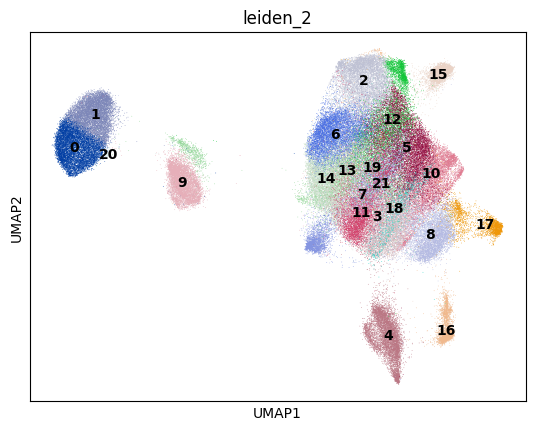

In [25]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

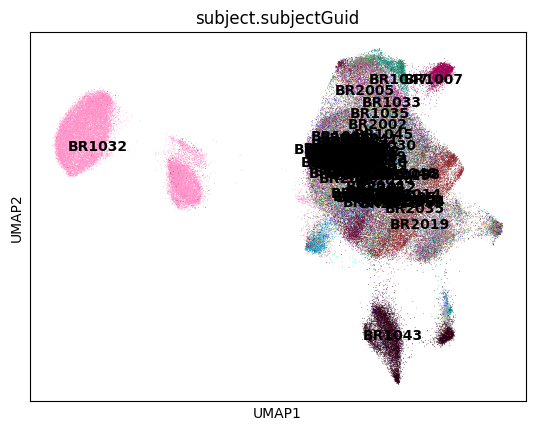

In [26]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

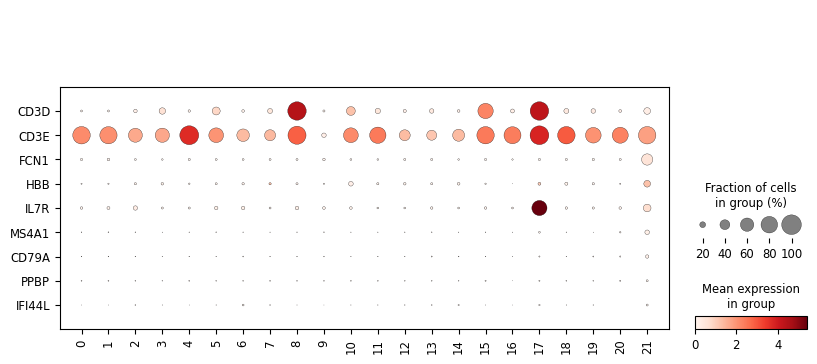

In [27]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

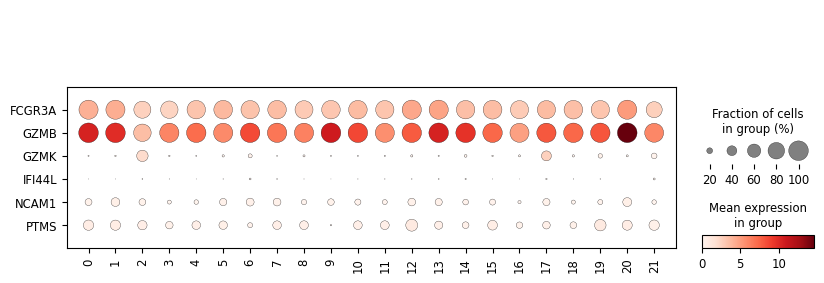

In [28]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [29]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     7875
1     7654
2     7482
3     7336
4     7309
5     7230
6     6865
7     6416
8     6399
9     6335
10    6140
11    5465
12    5040
13    4830
14    4582
15    3194
16    3157
17    2503
18    1361
19     202
20     120
21      21
Name: count, dtype: int64

### Outlier investigation

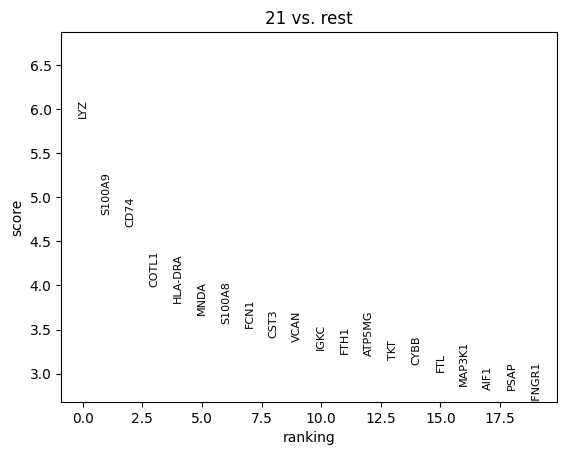

In [30]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['21']
)
sc.pl.rank_genes_groups(adata)

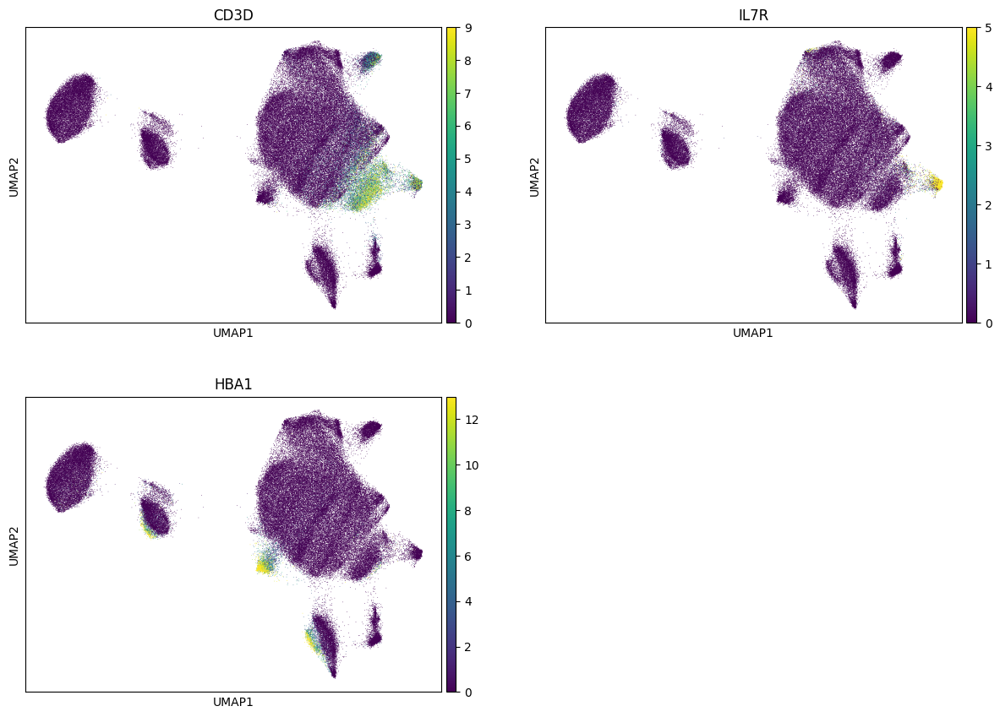

In [31]:
sc.pl.umap(adata, color = ['CD3D', 'IL7R', 'HBA1'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [32]:
adata = add_labels(adata, original_df)

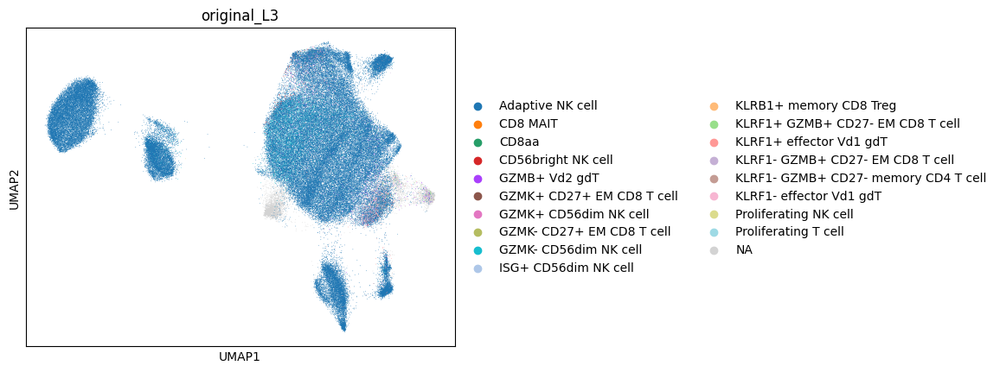

In [33]:
sc.pl.umap(adata, color = 'original_L3')

In [34]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Adaptive NK cell                        93509
NaN                                      6684
GZMK- CD56dim NK cell                    4106
KLRF1+ effector Vd1 gdT                   893
KLRF1- GZMB+ CD27- EM CD8 T cell          563
KLRF1- effector Vd1 gdT                   422
GZMK+ CD56dim NK cell                     359
GZMB+ Vd2 gdT                             353
KLRF1+ GZMB+ CD27- EM CD8 T cell          283
CD56bright NK cell                        158
ISG+ CD56dim NK cell                       90
Proliferating NK cell                      52
KLRF1- GZMB+ CD27- memory CD4 T cell       25
CD8aa                                       7
Proliferating T cell                        5
GZMK+ CD27+ EM CD8 T cell                   4
CD8 MAIT                                    1
GZMK- CD27+ EM CD8 T cell                   1
KLRB1+ memory CD8 Treg                      1
Name: count, dtype: int64

In [35]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Adaptive NK cell                        0.869722
NaN                                     0.062167
GZMK- CD56dim NK cell                   0.038190
KLRF1+ effector Vd1 gdT                 0.008306
KLRF1- GZMB+ CD27- EM CD8 T cell        0.005236
KLRF1- effector Vd1 gdT                 0.003925
GZMK+ CD56dim NK cell                   0.003339
GZMB+ Vd2 gdT                           0.003283
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.002632
CD56bright NK cell                      0.001470
ISG+ CD56dim NK cell                    0.000837
Proliferating NK cell                   0.000484
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000233
CD8aa                                   0.000065
Proliferating T cell                    0.000047
GZMK+ CD27+ EM CD8 T cell               0.000037
CD8 MAIT                                0.000009
GZMK- CD27+ EM CD8 T cell               0.000009
KLRB1+ memory CD8 Treg                  0.000009
Name: count, dtype: float64

### Proposed updates

- Remove CD3D+/IL7R+ cluster (8) as T cell doublet
- Remove HBA1+ cluster (18) as Erythrocyte doublet

## Review CD56bright NK cell

In [36]:
cell_type = 'CD56bright NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [37]:
type_uuid

'45cefd74-23ad-497c-b374-f8a52a67acd3'

In [38]:
adata = read_adata_uuid(type_uuid)

### Clustering

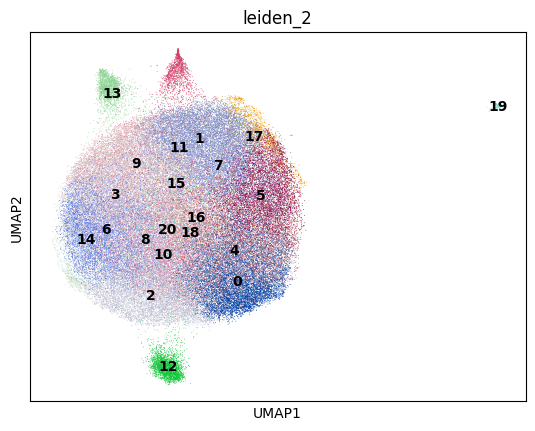

In [39]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

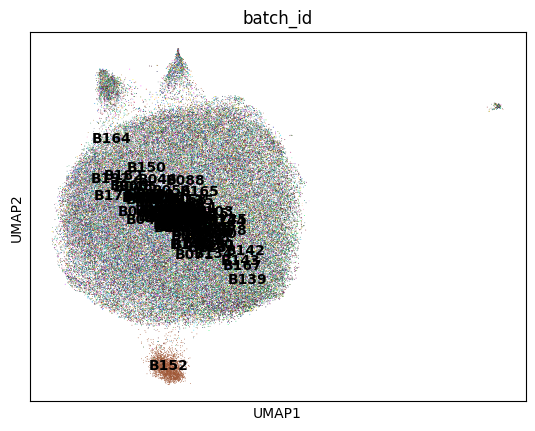

In [40]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

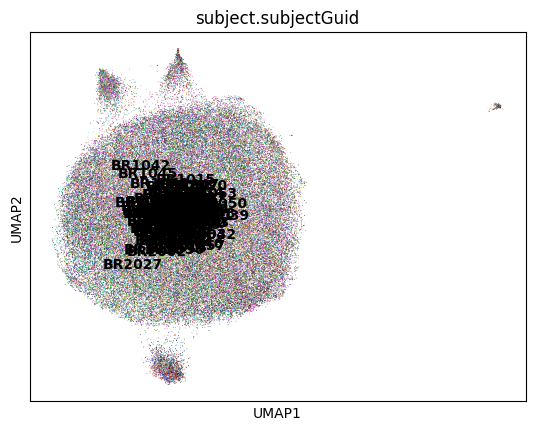

In [41]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

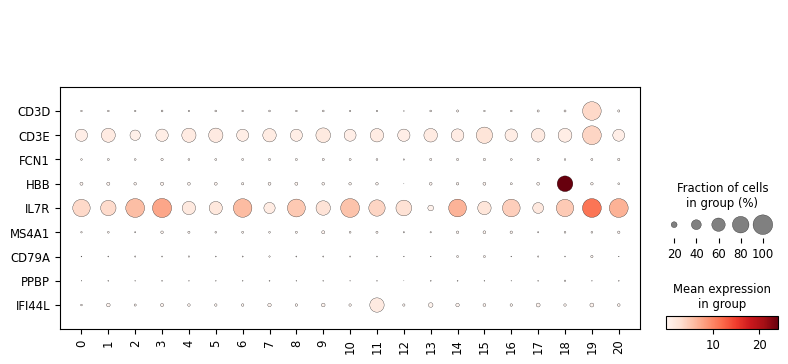

In [42]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

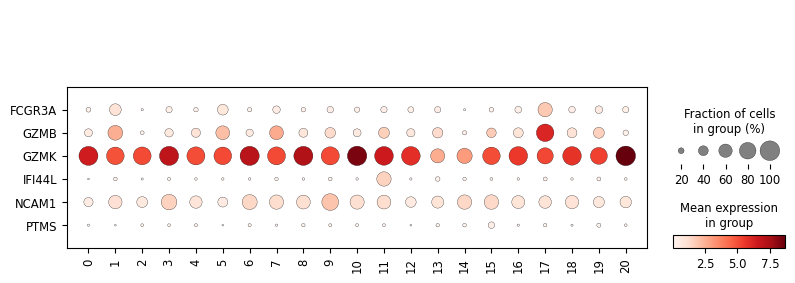

In [43]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [44]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     8348
1     7824
2     7148
3     7023
4     6815
5     6492
6     6425
7     6054
8     5984
9     5375
10    4502
11    3236
12    2779
13    2705
14    1804
15    1536
16    1496
17    1315
18     837
19     484
20     239
Name: count, dtype: int64

### Outlier investigation

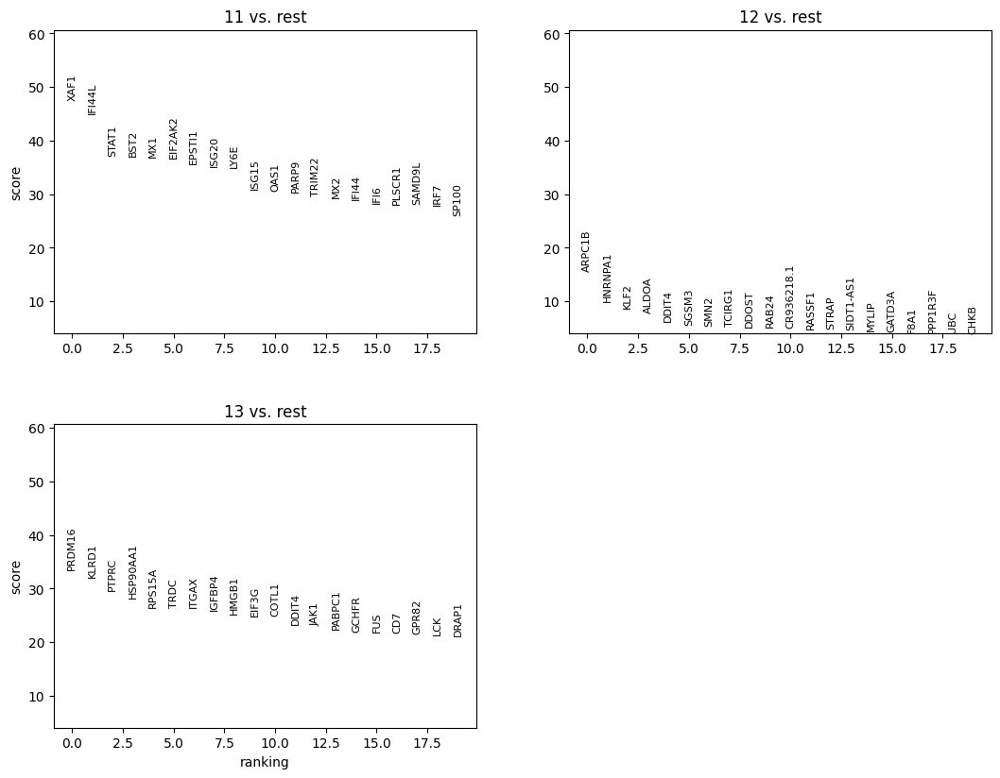

In [45]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['11','12','13']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

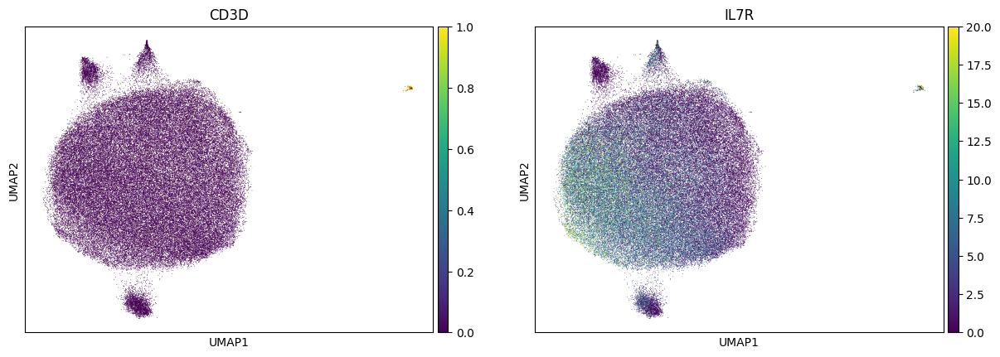

In [46]:
sc.pl.umap(adata, color = ['CD3D', 'IL7R'], vmax = 'p99', ncols = 2)

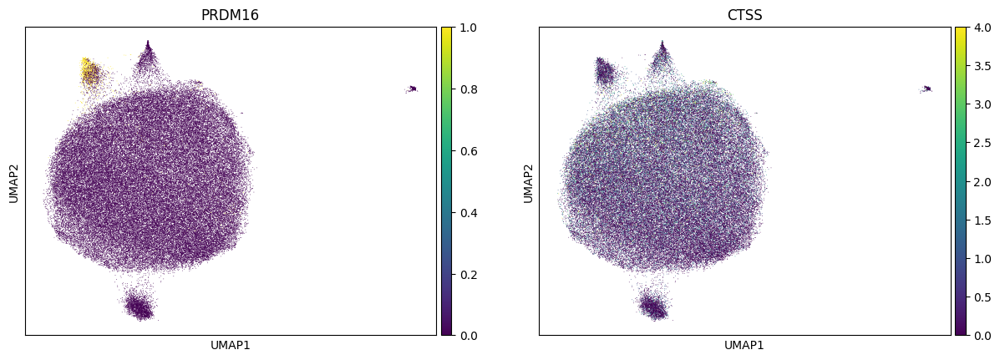

In [47]:
sc.pl.umap(adata, color = ['PRDM16','CTSS'], vmax = 'p99', ncols = 2)

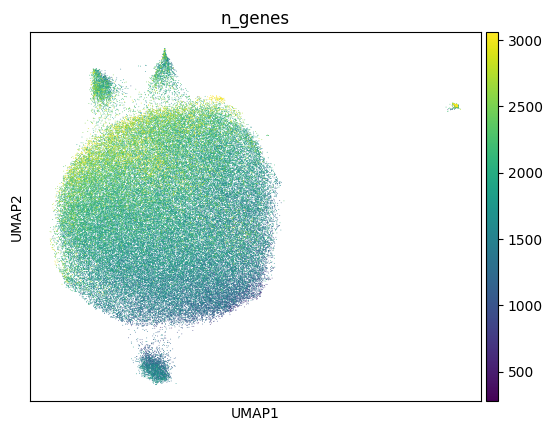

In [48]:
sc.pl.umap(adata, color = ['n_genes'], vmax = 'p99', ncols = 2)

/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


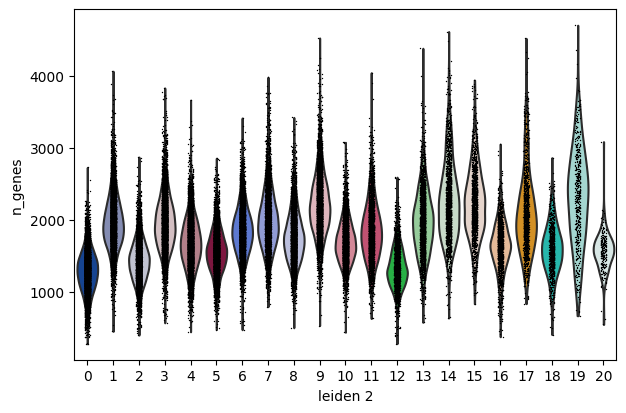

In [49]:
sc.pl.violin(adata, groupby = 'leiden_2', keys = 'n_genes')

### Comparison to original labels

In [50]:
adata = add_labels(adata, original_df)

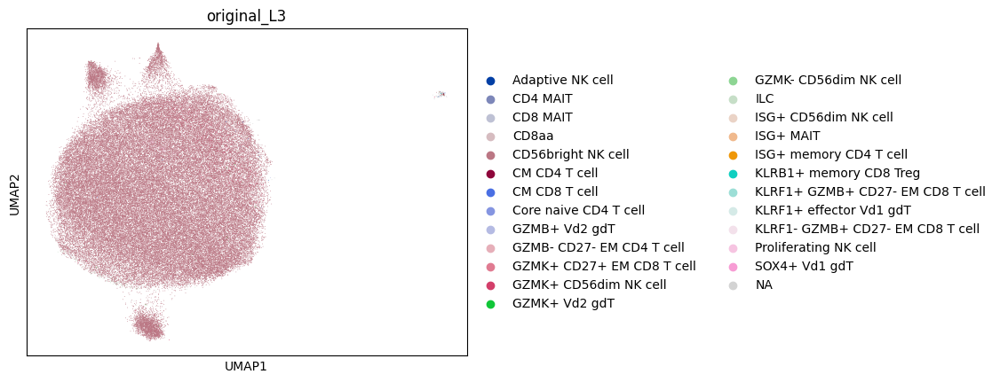

In [51]:
sc.pl.umap(adata, color = 'original_L3')

In [52]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD56bright NK cell                  86192
NaN                                  1099
GZMK+ CD56dim NK cell                 715
Proliferating NK cell                 160
ILC                                   124
ISG+ CD56dim NK cell                   32
GZMK+ Vd2 gdT                          18
Adaptive NK cell                       15
CD8aa                                  15
GZMK- CD56dim NK cell                  12
GZMB+ Vd2 gdT                           8
CM CD4 T cell                           7
SOX4+ Vd1 gdT                           3
CD8 MAIT                                3
KLRF1+ effector Vd1 gdT                 3
GZMB- CD27- EM CD4 T cell               2
GZMK+ CD27+ EM CD8 T cell               2
CM CD8 T cell                           2
KLRB1+ memory CD8 Treg                  2
KLRF1+ GZMB+ CD27- EM CD8 T cell        2
KLRF1- GZMB+ CD27- EM CD8 T cell        1
Core naive CD4 T cell                   1
ISG+ memory CD4 T cell                  1
CD4 MAIT              

In [53]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD56bright NK cell                  0.974791
NaN                                 0.012429
GZMK+ CD56dim NK cell               0.008086
Proliferating NK cell               0.001810
ILC                                 0.001402
ISG+ CD56dim NK cell                0.000362
GZMK+ Vd2 gdT                       0.000204
Adaptive NK cell                    0.000170
CD8aa                               0.000170
GZMK- CD56dim NK cell               0.000136
GZMB+ Vd2 gdT                       0.000090
CM CD4 T cell                       0.000079
SOX4+ Vd1 gdT                       0.000034
CD8 MAIT                            0.000034
KLRF1+ effector Vd1 gdT             0.000034
GZMB- CD27- EM CD4 T cell           0.000023
GZMK+ CD27+ EM CD8 T cell           0.000023
CM CD8 T cell                       0.000023
KLRB1+ memory CD8 Treg              0.000023
KLRF1+ GZMB+ CD27- EM CD8 T cell    0.000023
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000011
Core naive CD4 T cell               0.00001

### Suggested updates

- Remove CD3D+/IL7R+ cluster (9) as T cell doublet
- Remove Low gene expression cluster (18) as low quality

## Review GZMK- CD56dim NK cell

In [54]:
cell_type = 'GZMK- CD56dim NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [55]:
type_uuid

'32fa4f42-10f8-45ea-9dcc-f610476262bc'

In [56]:
adata = read_adata_uuid(type_uuid)

### Clustering

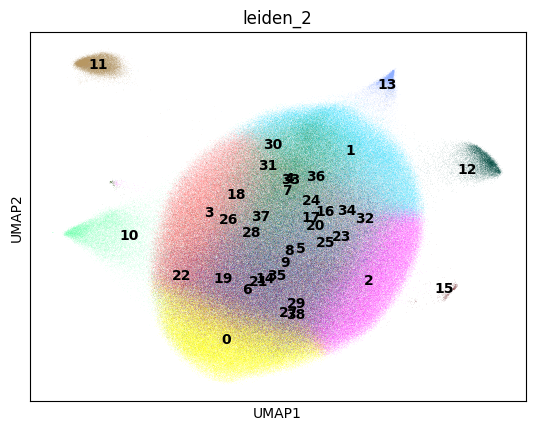

In [57]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

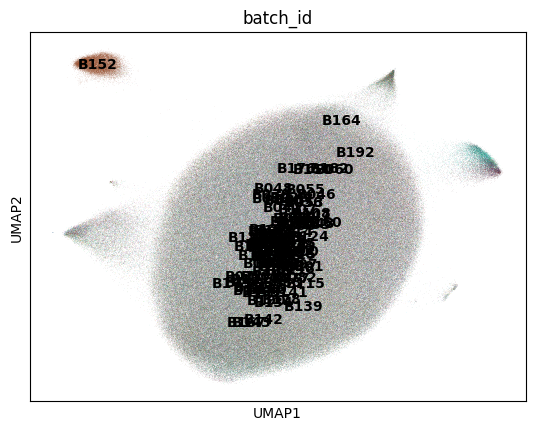

In [58]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

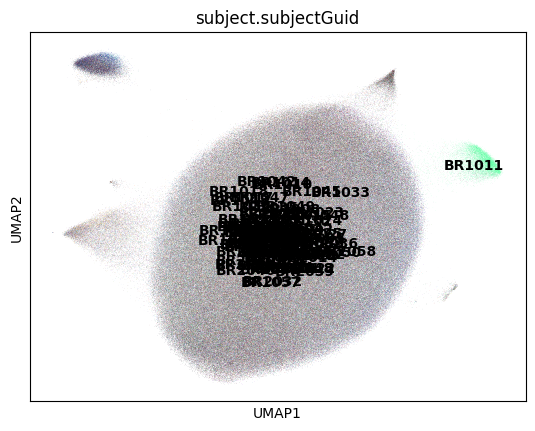

In [59]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

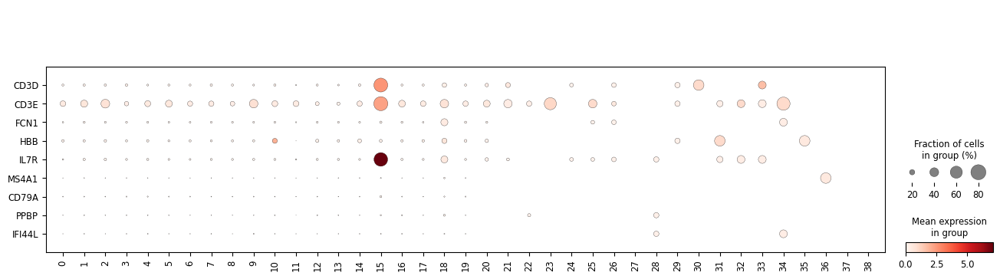

In [60]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

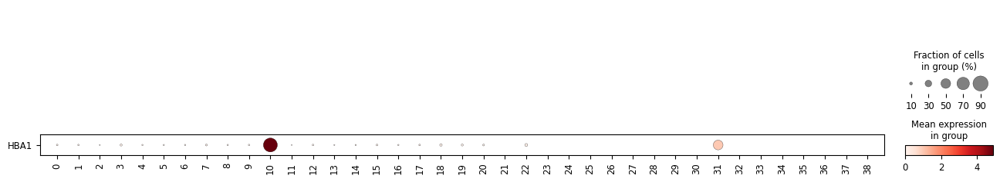

In [61]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['HBA1'], swap_axes = True)

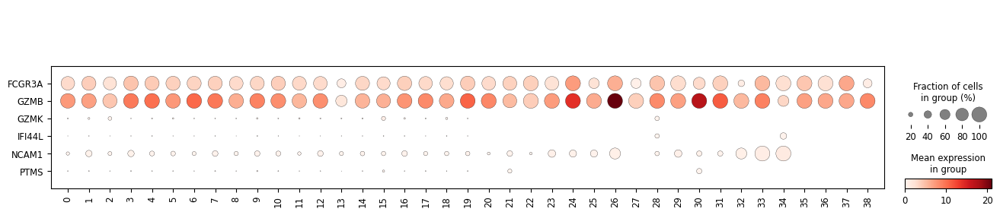

In [62]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [63]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     99866
1     88253
2     82395
3     79028
4     78257
5     71628
6     64124
7     61709
8     56776
9     52756
10    28556
11    23082
12    20369
13     7611
14     2090
15      889
16      639
17      617
18      368
19      337
20       18
21       11
22       10
23       10
24        8
25        8
26        6
28        5
29        5
27        5
30        4
31        4
32        3
33        3
34        3
35        2
36        2
37        2
38        2
Name: count, dtype: int64

### Outlier investigation

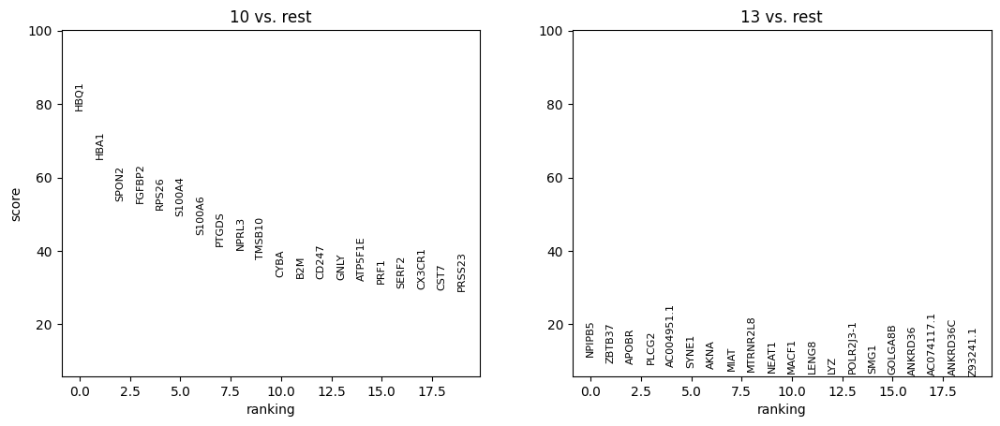

In [64]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['10','13']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

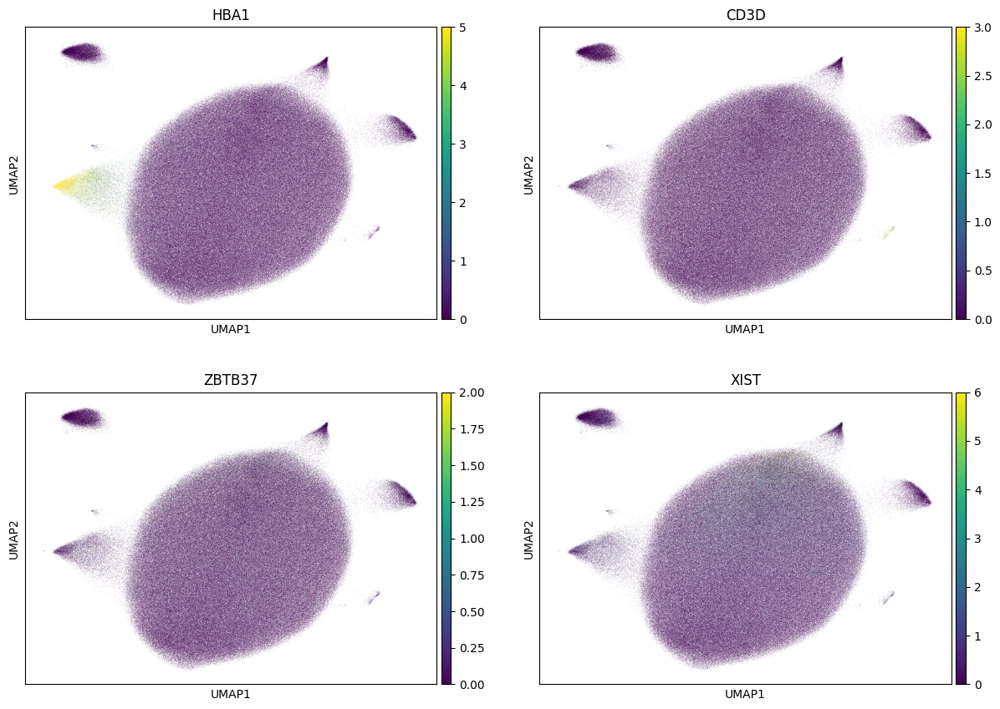

In [65]:
sc.pl.umap(adata, color = ['HBA1','CD3D','ZBTB37','XIST'], ncols = 2, vmax = 'p99')

### Comparison to original labels

In [66]:
adata = add_labels(adata, original_df)

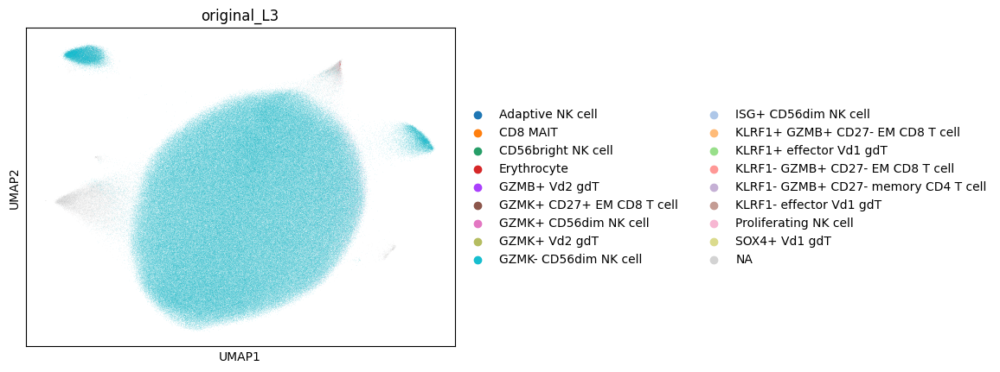

In [67]:
sc.pl.umap(adata, color = 'original_L3')

In [68]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK- CD56dim NK cell                   757911
NaN                                      46400
Adaptive NK cell                          5522
GZMK+ CD56dim NK cell                     5414
ISG+ CD56dim NK cell                      2941
Proliferating NK cell                      642
CD56bright NK cell                         218
GZMB+ Vd2 gdT                              203
Erythrocyte                                 84
KLRF1+ effector Vd1 gdT                     45
KLRF1- GZMB+ CD27- EM CD8 T cell            31
KLRF1+ GZMB+ CD27- EM CD8 T cell            15
CD8 MAIT                                    13
KLRF1- effector Vd1 gdT                     12
GZMK+ Vd2 gdT                                4
SOX4+ Vd1 gdT                                3
KLRF1- GZMB+ CD27- memory CD4 T cell         2
GZMK+ CD27+ EM CD8 T cell                    1
Name: count, dtype: int64

In [69]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK- CD56dim NK cell                   0.924890
NaN                                     0.056623
Adaptive NK cell                        0.006739
GZMK+ CD56dim NK cell                   0.006607
ISG+ CD56dim NK cell                    0.003589
Proliferating NK cell                   0.000783
CD56bright NK cell                      0.000266
GZMB+ Vd2 gdT                           0.000248
Erythrocyte                             0.000103
KLRF1+ effector Vd1 gdT                 0.000055
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000038
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000018
CD8 MAIT                                0.000016
KLRF1- effector Vd1 gdT                 0.000015
GZMK+ Vd2 gdT                           0.000005
SOX4+ Vd1 gdT                           0.000004
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000002
GZMK+ CD27+ EM CD8 T cell               0.000001
Name: count, dtype: float64

### Suggested updates

- Remove CD3D+/IL7R+ cluster (13) as T cell doublet
- Remove HBA1+ cluster (10) as Erythrocyte doublet

## Review GZMK+ CD56dim NK cell

In [70]:
cell_type = 'GZMK+ CD56dim NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [71]:
type_uuid

'e865f0db-cc01-4e9b-bce2-36697a892927'

In [72]:
adata = read_adata_uuid(type_uuid)

### Clustering

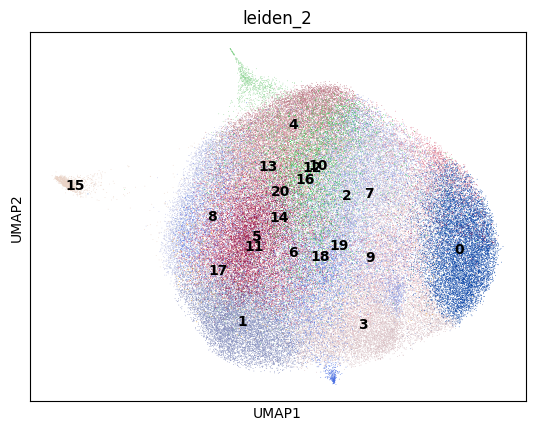

In [73]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

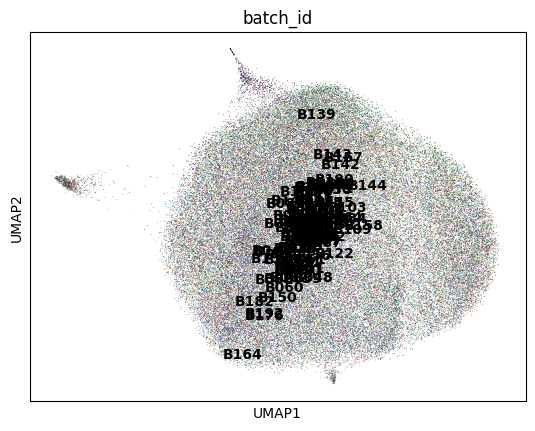

In [74]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

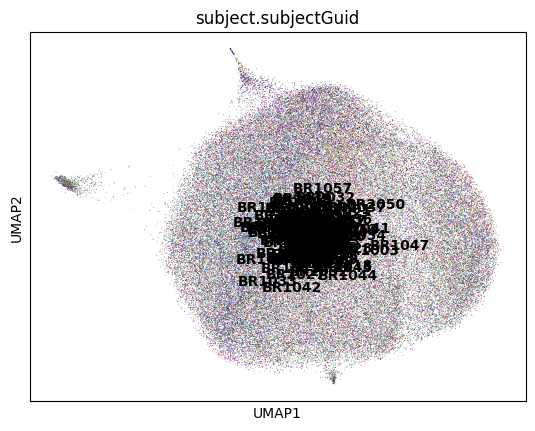

In [75]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

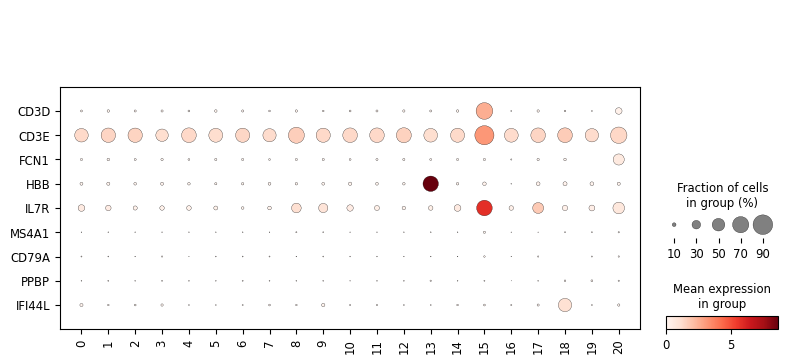

In [76]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

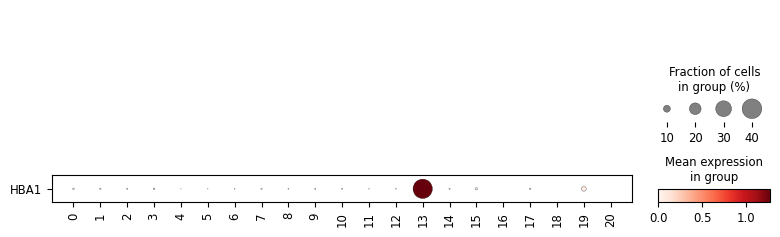

In [77]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['HBA1'], swap_axes = True)

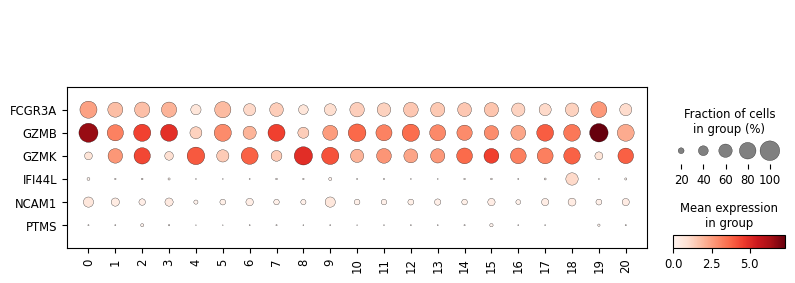

In [78]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

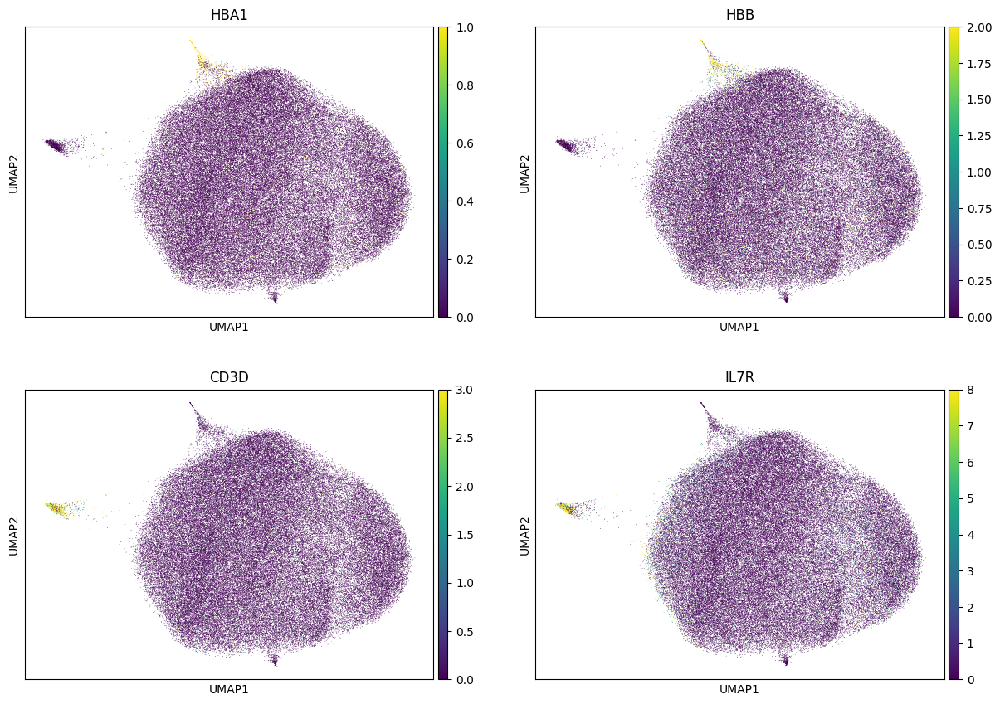

In [79]:
sc.pl.umap(adata, color = ['HBA1','HBB','CD3D','IL7R'], ncols = 2, vmax = 'p99')

### GZMK+/GZMK- boundary investigation

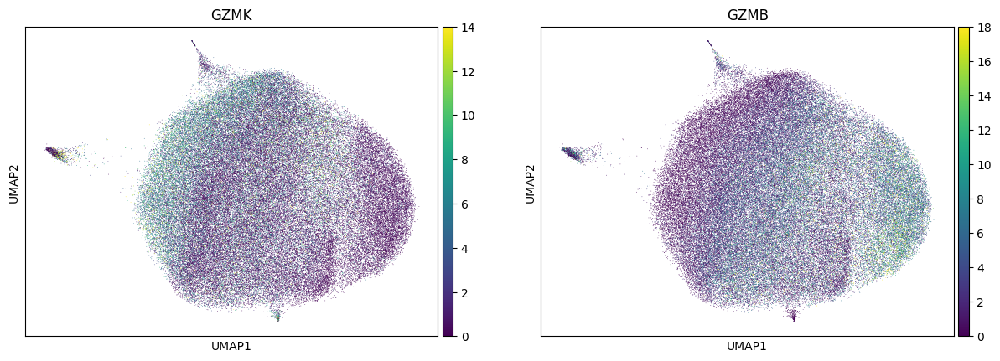

In [80]:
sc.pl.umap(adata, color = ['GZMK','GZMB'], ncols = 2, vmax = 'p99')

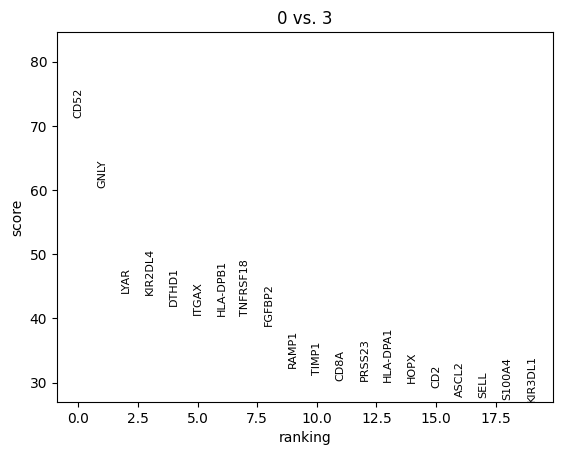

In [81]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['0'],
    reference = '3'
)
sc.pl.rank_genes_groups(adata, ncols = 2)

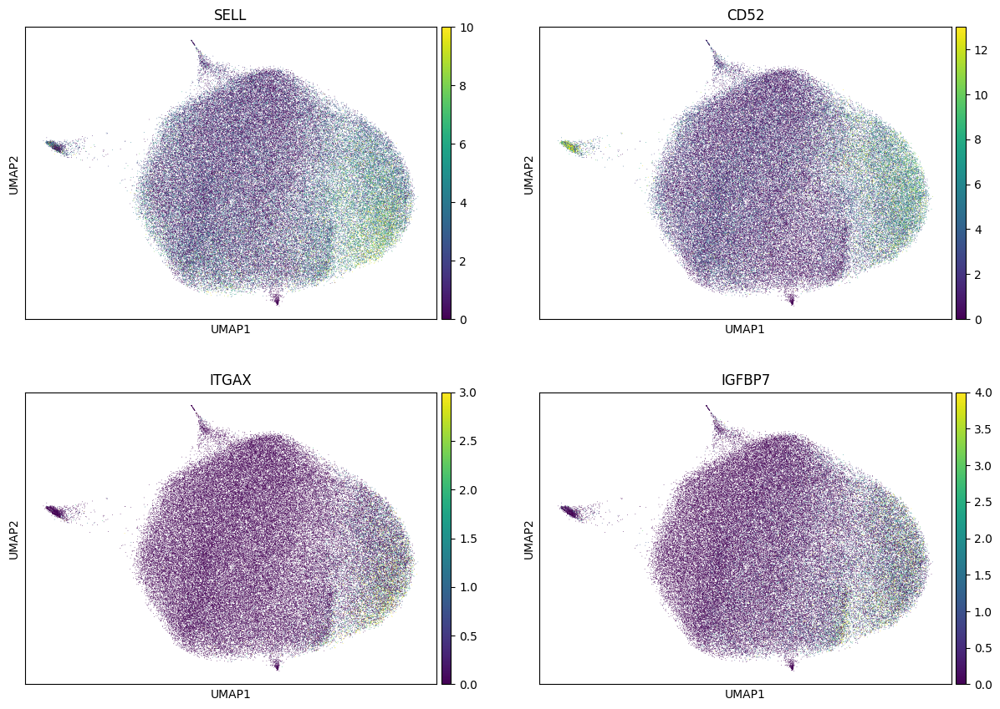

In [82]:
sc.pl.umap(adata, color = ['SELL','CD52','ITGAX','IGFBP7'], ncols = 2, vmax = 'p99')

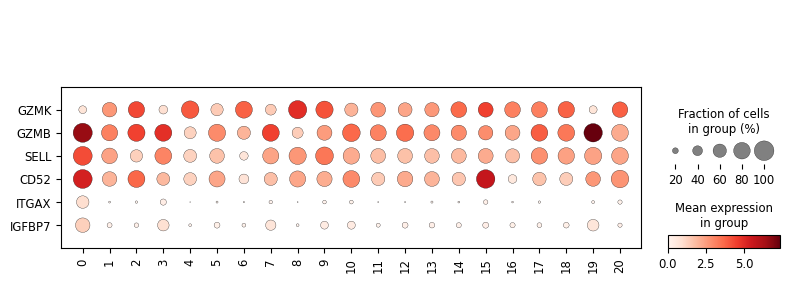

In [83]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['GZMK', 'GZMB', 'SELL', 'CD52','ITGAX','IGFBP7'], swap_axes = True)

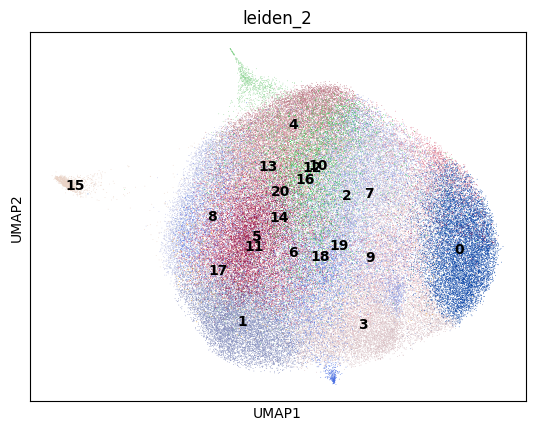

In [84]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Cluster counts

In [85]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     10279
1      8997
2      8624
3      8290
4      7980
5      6906
6      6886
7      6179
8      6175
9      6071
10     5560
11     4583
12     4296
13     2439
14     2316
15     1542
16     1526
17      465
18      145
19       50
20       38
Name: count, dtype: int64

### Comparison to original labels

In [86]:
adata = add_labels(adata, original_df)

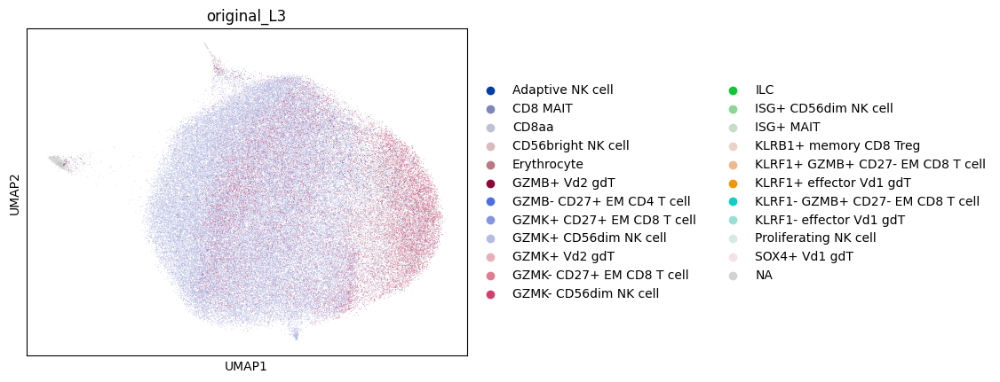

In [87]:
sc.pl.umap(adata, color = 'original_L3')

In [88]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK+ CD56dim NK cell               71435
GZMK- CD56dim NK cell               13603
CD56bright NK cell                  10235
NaN                                  2169
Adaptive NK cell                      910
ISG+ CD56dim NK cell                  401
GZMB+ Vd2 gdT                         214
Proliferating NK cell                 148
GZMK+ Vd2 gdT                         139
KLRF1+ GZMB+ CD27- EM CD8 T cell       35
CD8 MAIT                               14
KLRF1+ effector Vd1 gdT                11
KLRF1- GZMB+ CD27- EM CD8 T cell       11
KLRF1- effector Vd1 gdT                 6
CD8aa                                   5
GZMK+ CD27+ EM CD8 T cell               3
ILC                                     2
GZMB- CD27+ EM CD4 T cell               1
SOX4+ Vd1 gdT                           1
ISG+ MAIT                               1
KLRB1+ memory CD8 Treg                  1
GZMK- CD27+ EM CD8 T cell               1
Erythrocyte                             1
Name: count, dtype: in

In [89]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK+ CD56dim NK cell               0.719045
GZMK- CD56dim NK cell               0.136924
CD56bright NK cell                  0.103023
NaN                                 0.021833
Adaptive NK cell                    0.009160
ISG+ CD56dim NK cell                0.004036
GZMB+ Vd2 gdT                       0.002154
Proliferating NK cell               0.001490
GZMK+ Vd2 gdT                       0.001399
KLRF1+ GZMB+ CD27- EM CD8 T cell    0.000352
CD8 MAIT                            0.000141
KLRF1+ effector Vd1 gdT             0.000111
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000111
KLRF1- effector Vd1 gdT             0.000060
CD8aa                               0.000050
GZMK+ CD27+ EM CD8 T cell           0.000030
ILC                                 0.000020
GZMB- CD27+ EM CD4 T cell           0.000010
SOX4+ Vd1 gdT                       0.000010
ISG+ MAIT                           0.000010
KLRB1+ memory CD8 Treg              0.000010
GZMK- CD27+ EM CD8 T cell           0.00001

### Suggested updates

- Remove CD3D+/IL7R+ cluster (14) as T cell doublet
- Remove HBA1+ cluster (15) as Erythrocyte doublet
- Reassign GZMK-low/ITGAX+ (CD11c+) clusters (5,6,7,9) as GZMK- CD56dim NK cell

## Review ISG+ CD56dim NK cell

In [90]:
cell_type = 'ISG+ CD56dim NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [91]:
type_uuid

'031d7bcb-922b-4088-b9f4-1fc2c2c22464'

In [92]:
adata = read_adata_uuid(type_uuid)

### Clustering

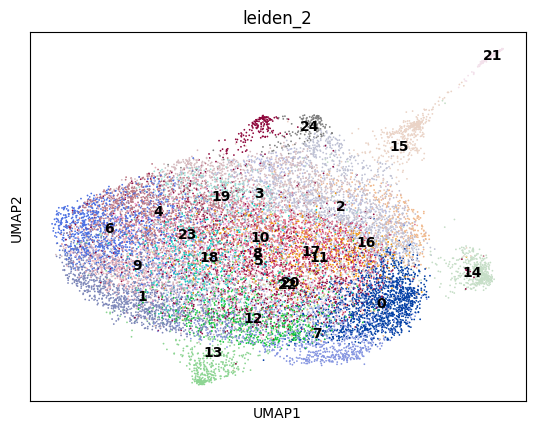

In [93]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

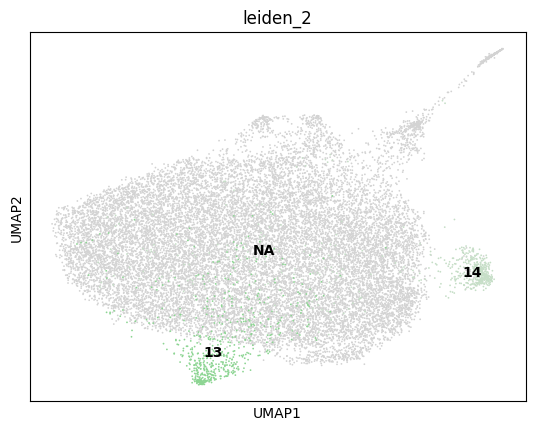

In [94]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = ['13','14'])

### Marker expression

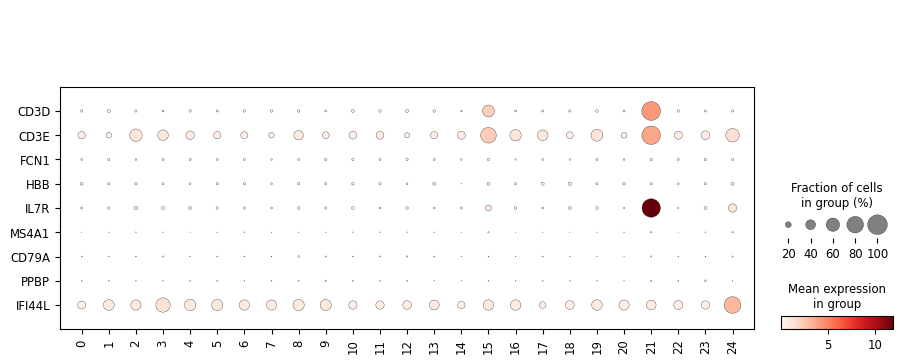

In [95]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

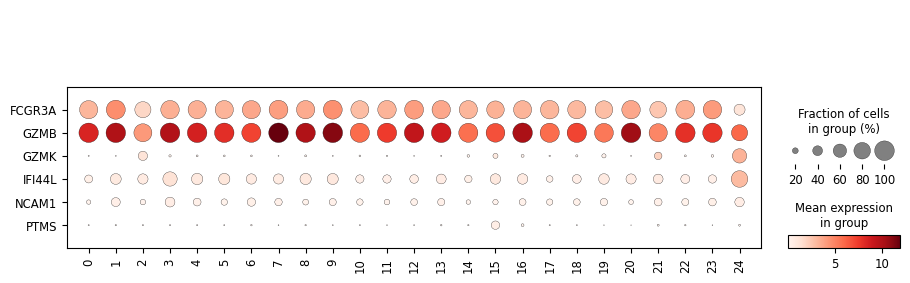

In [96]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [97]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1439
1     1400
2     1347
3     1303
4     1297
5     1173
6     1055
7     1020
8      920
9      717
10     694
11     671
12     609
13     599
14     589
15     567
16     516
17     516
18     469
19     392
20     386
21     257
22     252
23     226
24     170
Name: count, dtype: int64

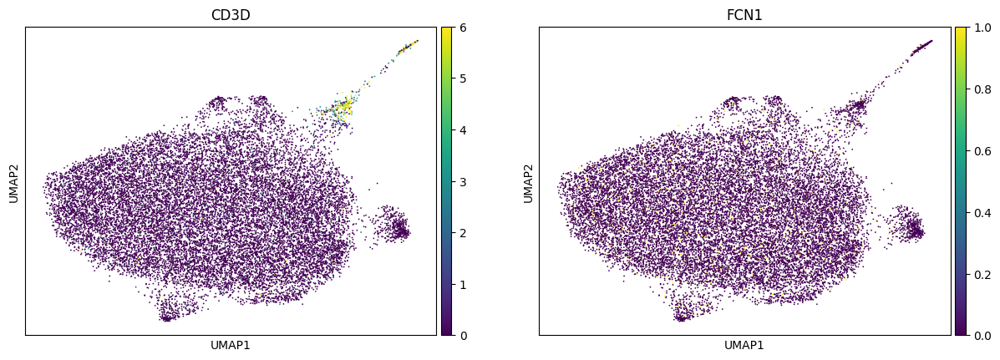

In [98]:
sc.pl.umap(adata, color = ['CD3D','FCN1'], vmax = 'p99')

### Comparison to original labels

In [99]:
adata = add_labels(adata, original_df)

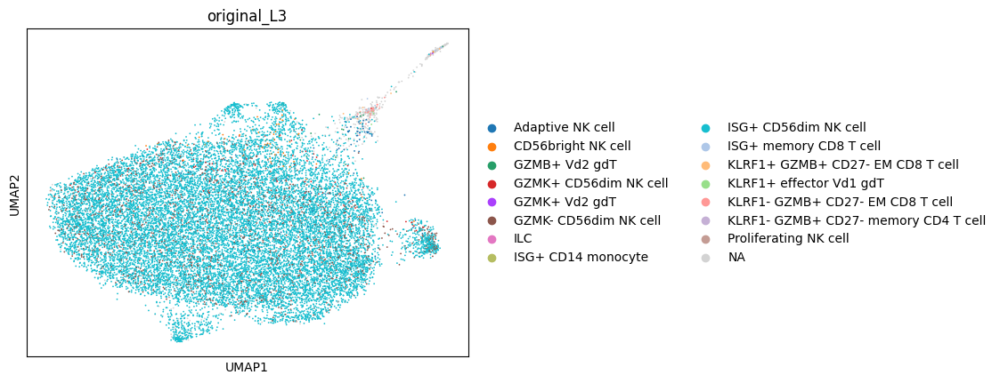

In [100]:
sc.pl.umap(adata, color = 'original_L3')

In [101]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ CD56dim NK cell                    15901
GZMK- CD56dim NK cell                    1559
NaN                                       729
Adaptive NK cell                          136
GZMK+ CD56dim NK cell                      82
CD56bright NK cell                         64
Proliferating NK cell                      40
KLRF1- GZMB+ CD27- EM CD8 T cell           29
GZMB+ Vd2 gdT                              19
ISG+ memory CD8 T cell                     10
KLRF1+ GZMB+ CD27- EM CD8 T cell            7
KLRF1+ effector Vd1 gdT                     4
GZMK+ Vd2 gdT                               1
ILC                                         1
ISG+ CD14 monocyte                          1
KLRF1- GZMB+ CD27- memory CD4 T cell        1
Name: count, dtype: int64

In [102]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ CD56dim NK cell                    0.855628
GZMK- CD56dim NK cell                   0.083889
NaN                                     0.039227
Adaptive NK cell                        0.007318
GZMK+ CD56dim NK cell                   0.004412
CD56bright NK cell                      0.003444
Proliferating NK cell                   0.002152
KLRF1- GZMB+ CD27- EM CD8 T cell        0.001560
GZMB+ Vd2 gdT                           0.001022
ISG+ memory CD8 T cell                  0.000538
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000377
KLRF1+ effector Vd1 gdT                 0.000215
GZMK+ Vd2 gdT                           0.000054
ILC                                     0.000054
ISG+ CD14 monocyte                      0.000054
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000054
Name: count, dtype: float64

### Suggested updates

- Remove CD3D+/IL7R+ clusters (11, 13) as T cell doublet

## Review Proliferating NK cell

In [103]:
cell_type = 'Proliferating NK cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [104]:
type_uuid

'cc9f3333-9504-4dde-a8dc-7e41eda58b6b'

In [105]:
adata = read_adata_uuid(type_uuid)

### Clustering

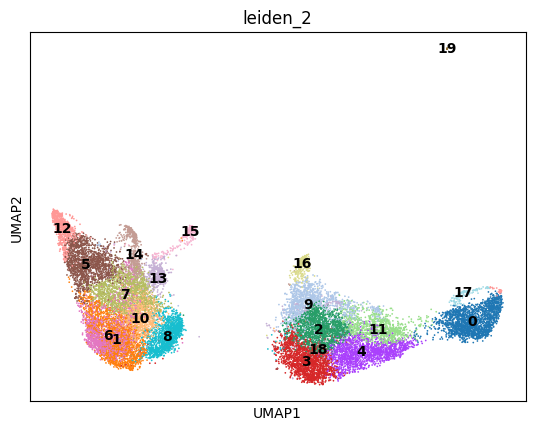

In [106]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

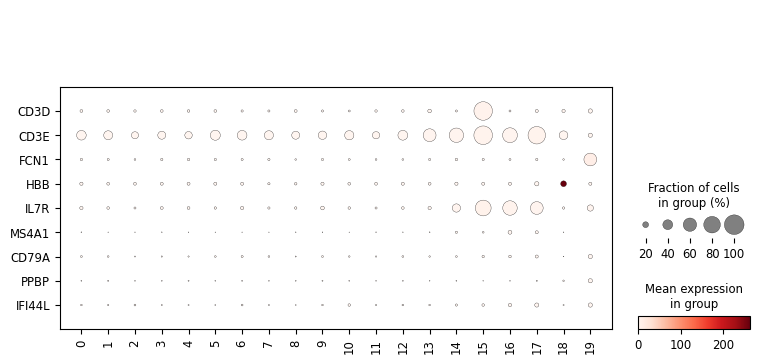

In [107]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

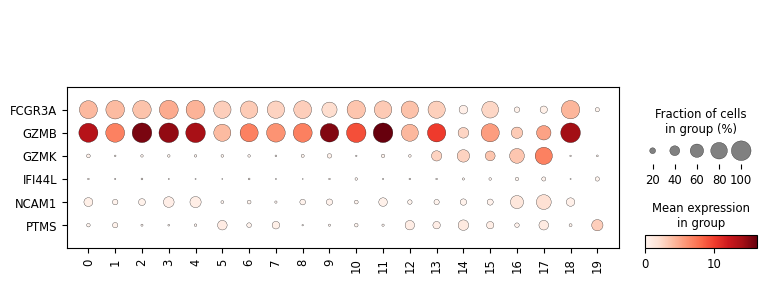

In [108]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [109]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1905
1     1657
2     1644
3     1642
4     1597
5     1460
6     1325
7     1307
8     1240
9     1189
10     945
11     934
12     716
13     579
14     511
15     323
16     311
17     119
18      86
19      23
Name: count, dtype: int64

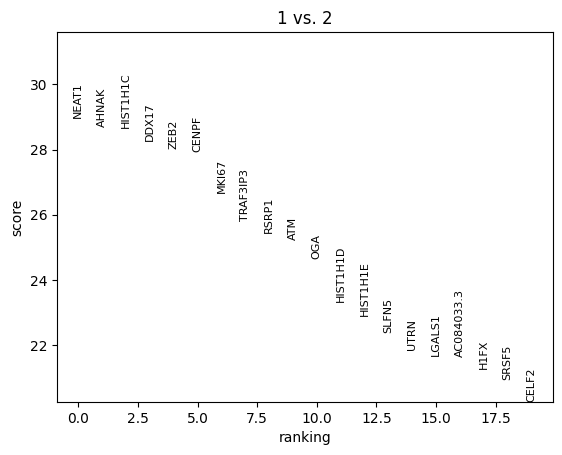

In [110]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1'],
    reference = '2'
)
sc.pl.rank_genes_groups(adata, ncols = 2)

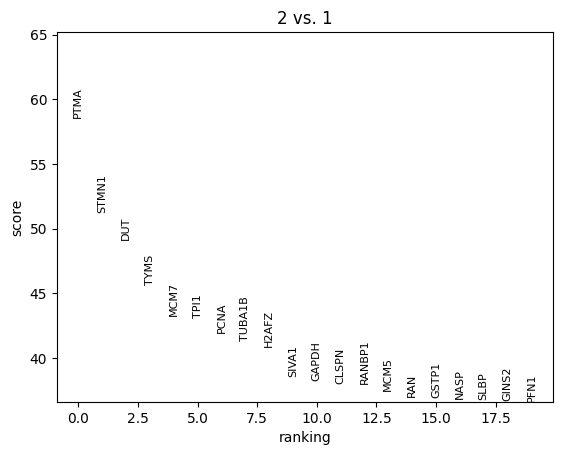

In [111]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['2'],
    reference = '1'
)
sc.pl.rank_genes_groups(adata, ncols = 2)

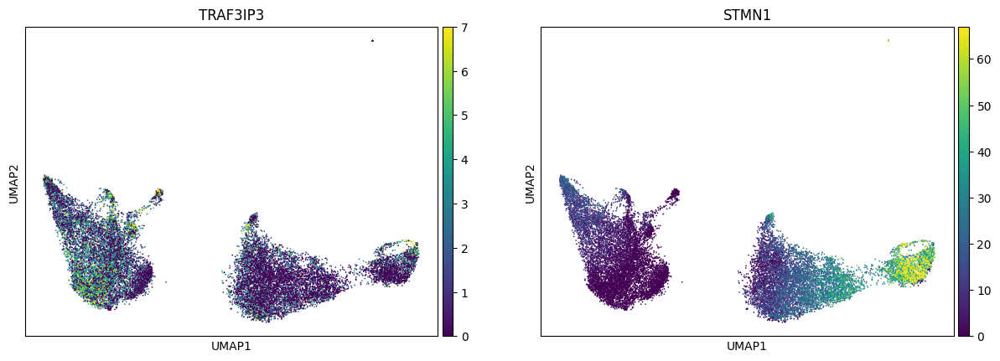

In [112]:
sc.pl.umap(adata, color = ['TRAF3IP3','STMN1'], vmax = 'p99')

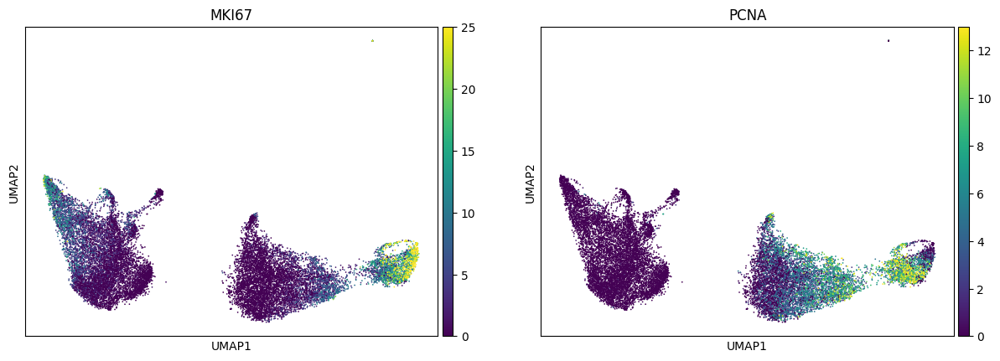

In [113]:
sc.pl.umap(adata, color = ['MKI67','PCNA'], vmax = 'p99')

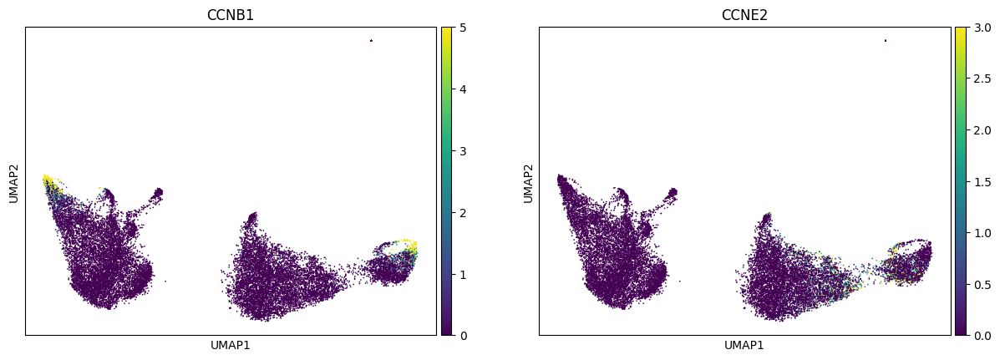

In [114]:
sc.pl.umap(adata, color = ['CCNB1','CCNE2'], vmax = 'p99')

### Comparison to original labels

In [115]:
adata = add_labels(adata, original_df)

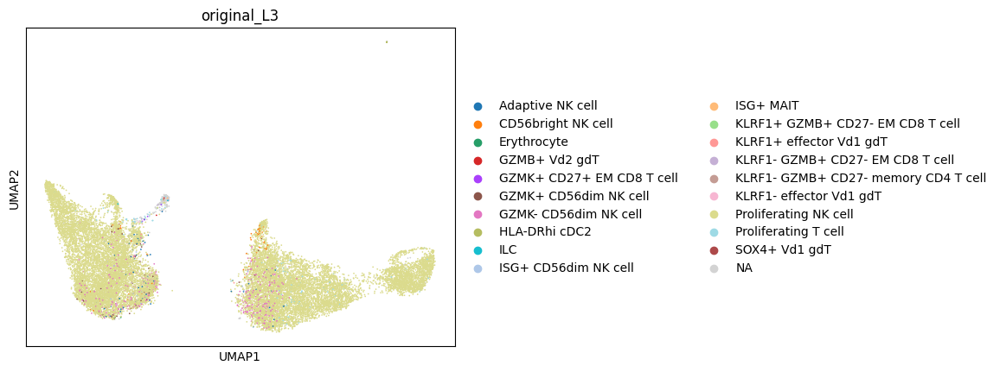

In [116]:
sc.pl.umap(adata, color = 'original_L3')

In [117]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Proliferating NK cell                   18179
GZMK- CD56dim NK cell                     488
NaN                                       370
Proliferating T cell                      152
Adaptive NK cell                          102
CD56bright NK cell                         84
GZMK+ CD56dim NK cell                      70
ISG+ CD56dim NK cell                       29
HLA-DRhi cDC2                               8
KLRF1+ effector Vd1 gdT                     7
GZMK+ CD27+ EM CD8 T cell                   4
KLRF1- GZMB+ CD27- EM CD8 T cell            4
GZMB+ Vd2 gdT                               4
ILC                                         3
KLRF1- effector Vd1 gdT                     3
Erythrocyte                                 2
KLRF1+ GZMB+ CD27- EM CD8 T cell            1
KLRF1- GZMB+ CD27- memory CD4 T cell        1
SOX4+ Vd1 gdT                               1
ISG+ MAIT                                   1
Name: count, dtype: int64

In [118]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Proliferating NK cell                   0.931635
GZMK- CD56dim NK cell                   0.025009
NaN                                     0.018962
Proliferating T cell                    0.007790
Adaptive NK cell                        0.005227
CD56bright NK cell                      0.004305
GZMK+ CD56dim NK cell                   0.003587
ISG+ CD56dim NK cell                    0.001486
HLA-DRhi cDC2                           0.000410
KLRF1+ effector Vd1 gdT                 0.000359
GZMK+ CD27+ EM CD8 T cell               0.000205
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000205
GZMB+ Vd2 gdT                           0.000205
ILC                                     0.000154
KLRF1- effector Vd1 gdT                 0.000154
Erythrocyte                             0.000102
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000051
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000051
SOX4+ Vd1 gdT                           0.000051
ISG+ MAIT                               0.000051
Name: co

### Suggested updates

- Remove CD3D+/IL7R+ cluster (16) as T cell doublet
- Remove FCN1+ cluster (18) as Myeloid doublet

## Review ILC

In [119]:
cell_type = 'ILC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [120]:
type_uuid

'07100338-8f65-4ec9-a6f7-aba71c6ace8b'

In [121]:
adata = read_adata_uuid(type_uuid)

### Clustering

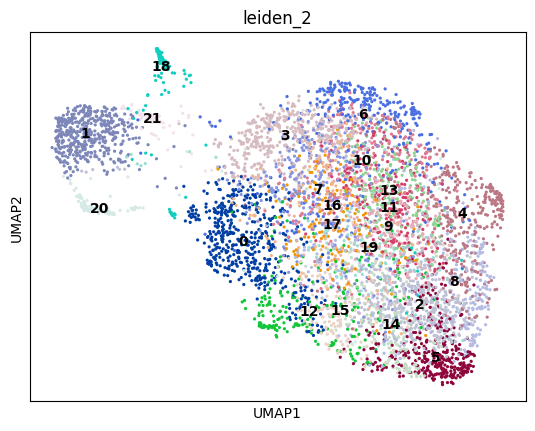

In [122]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

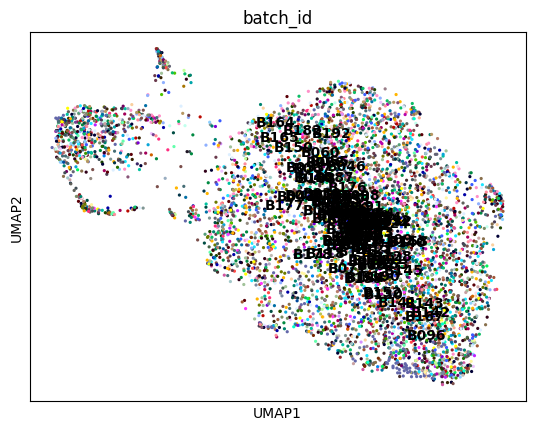

In [123]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

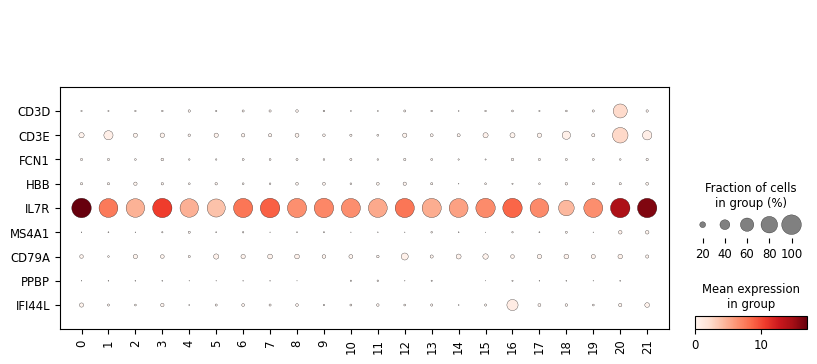

In [124]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

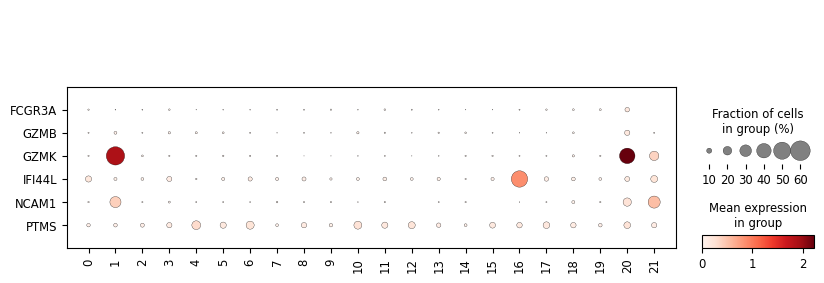

In [125]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

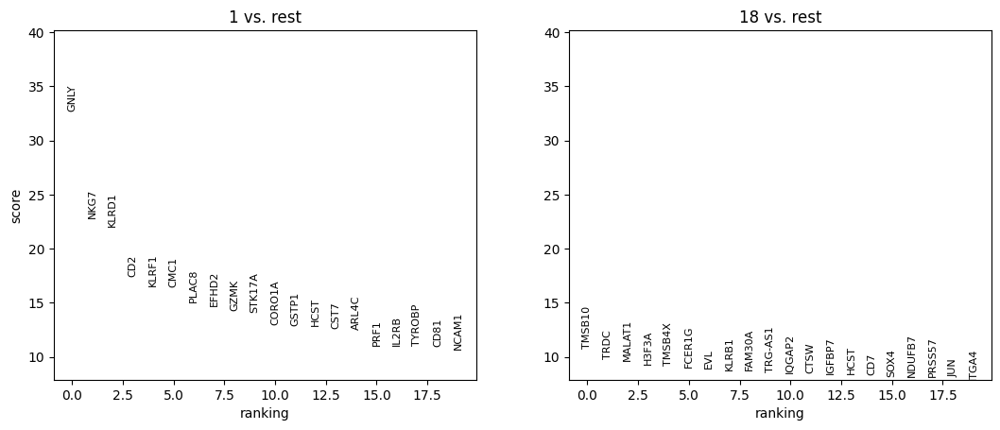

In [126]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1','18']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

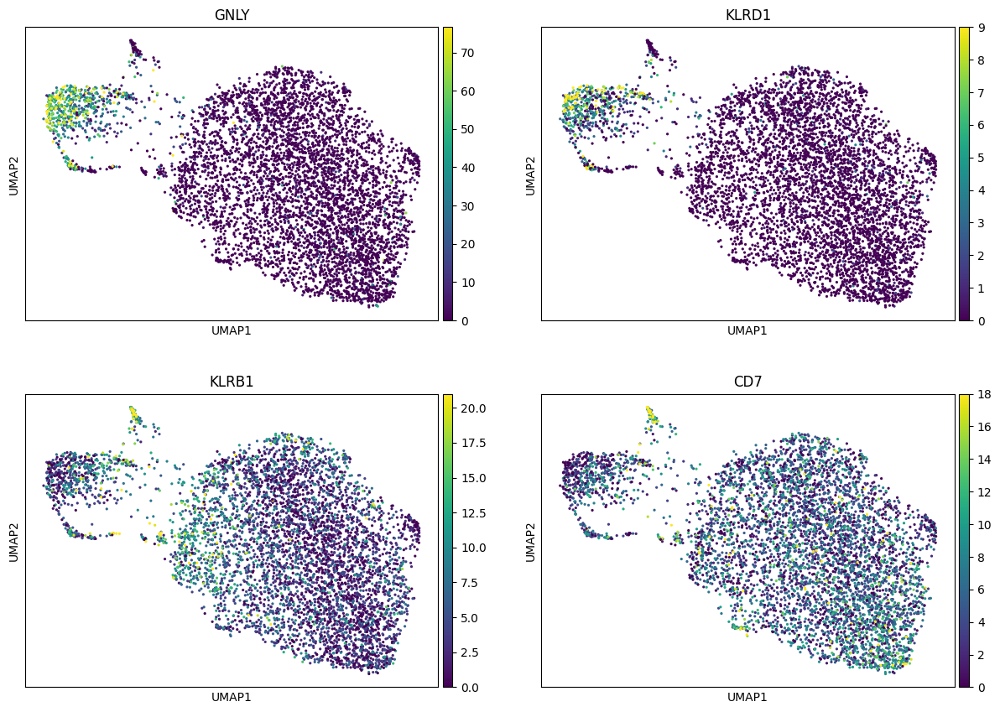

In [127]:
sc.pl.umap(adata, color = ['GNLY', 'KLRD1', 'KLRB1', 'CD7'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [128]:
adata = add_labels(adata, original_df)

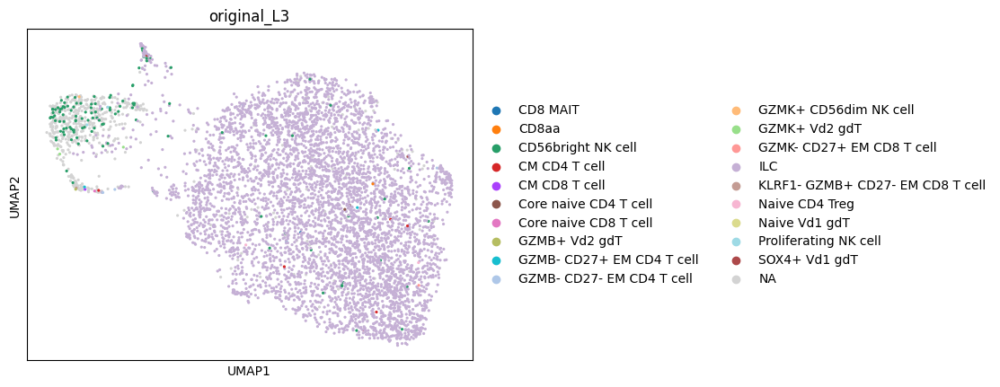

In [129]:
sc.pl.umap(adata, color = 'original_L3')

In [130]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ILC                                 4868
NaN                                  617
CD56bright NK cell                   117
CM CD4 T cell                          6
SOX4+ Vd1 gdT                          4
GZMB- CD27+ EM CD4 T cell              4
GZMB- CD27- EM CD4 T cell              4
GZMK+ Vd2 gdT                          3
Core naive CD4 T cell                  2
Proliferating NK cell                  2
Naive CD4 Treg                         2
Naive Vd1 gdT                          1
KLRF1- GZMB+ CD27- EM CD8 T cell       1
CD8 MAIT                               1
GZMK- CD27+ EM CD8 T cell              1
CD8aa                                  1
GZMB+ Vd2 gdT                          1
Core naive CD8 T cell                  1
CM CD8 T cell                          1
GZMK+ CD56dim NK cell                  1
Name: count, dtype: int64

In [131]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ILC                                 0.863427
NaN                                 0.109436
CD56bright NK cell                  0.020752
CM CD4 T cell                       0.001064
SOX4+ Vd1 gdT                       0.000709
GZMB- CD27+ EM CD4 T cell           0.000709
GZMB- CD27- EM CD4 T cell           0.000709
GZMK+ Vd2 gdT                       0.000532
Core naive CD4 T cell               0.000355
Proliferating NK cell               0.000355
Naive CD4 Treg                      0.000355
Naive Vd1 gdT                       0.000177
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000177
CD8 MAIT                            0.000177
GZMK- CD27+ EM CD8 T cell           0.000177
CD8aa                               0.000177
GZMB+ Vd2 gdT                       0.000177
Core naive CD8 T cell               0.000177
CM CD8 T cell                       0.000177
GZMK+ CD56dim NK cell               0.000177
Name: count, dtype: float64

### Suggested updates

- Remove CD3D+/IL7R+ cluster (21) as T cell doublet
- Reassign NCAM1+/KLRD1+ cluster (0) as CD56bright NK cell

In [132]:
os.system('jupyter nbconvert --to html --template pj 11f-Python_review_L3_nk_data.ipynb')

[NbConvertApp] WARNING | Config option `kernel_spec_manager_class` not recognized by `NbConvertApp`.
[NbConvertApp] Converting notebook 11f-Python_review_L3_nk_data.ipynb to html
[NbConvertApp] Writing 10610996 bytes to 11f-Python_review_L3_nk_data.html


0

In [133]:
import session_info
session_info.show()